In [63]:
import os 
import numpy as np
import matplotlib.pyplot as plt
from skimage import io, color, util, filters, morphology
import cv2 as cv

In [61]:
path_dir='Tugas Lab 5 - Images\\Tugas Lab 5 - Images'
dragon_types = ['fire_dragon', 'water_dragon']

# Number 1

fire_dragon 1.jpg predicted as fire_dragon


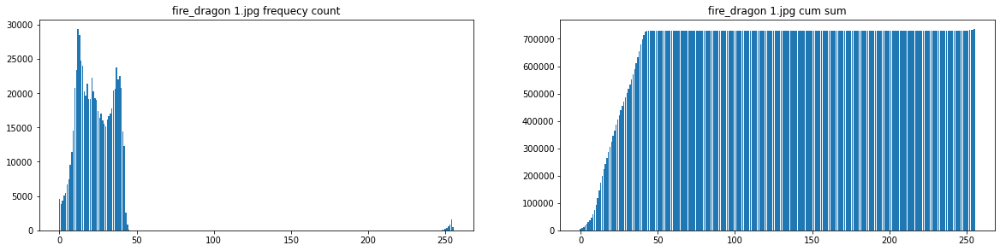

fire_dragon 2.jpg predicted as fire_dragon


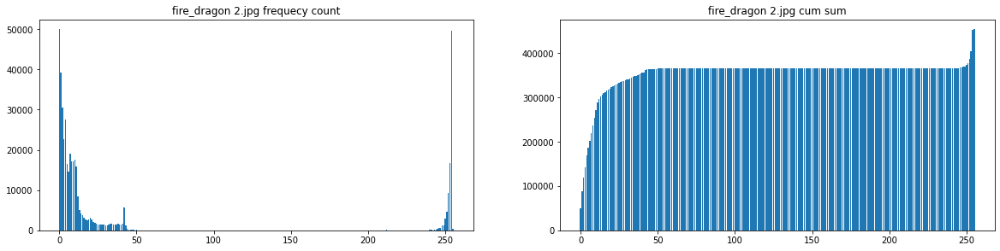

fire_dragon 3.jpg predicted as fire_dragon


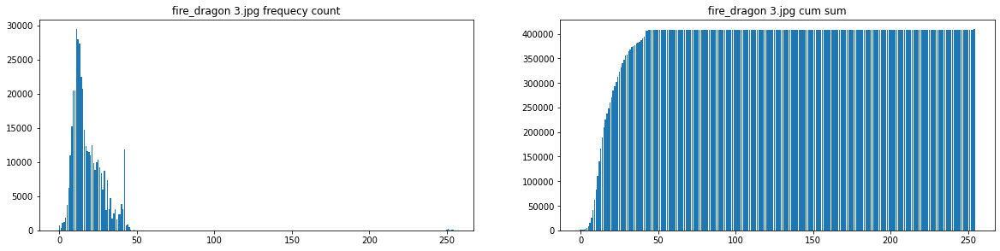

fire_dragon 4.jpg predicted as fire_dragon


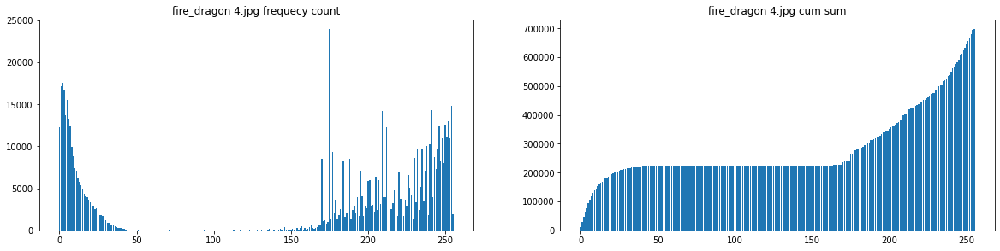

fire_dragon 5.jpg predicted as fire_dragon


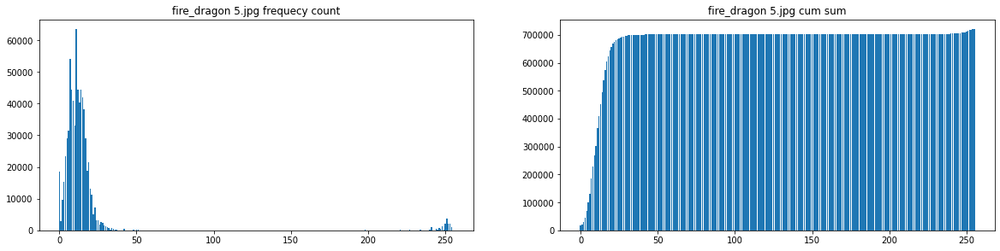

water_dragon 1.jpg predicted as water_dragon


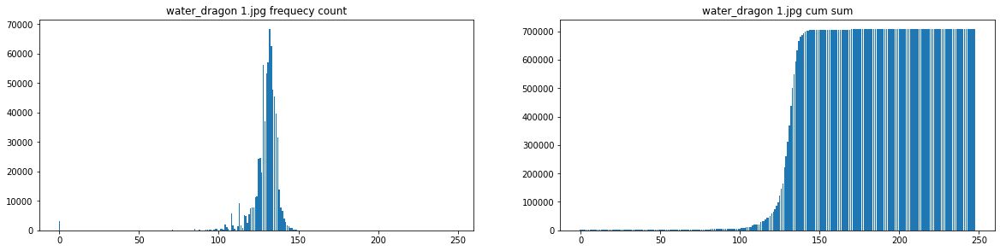

water_dragon 2.jpg predicted as water_dragon


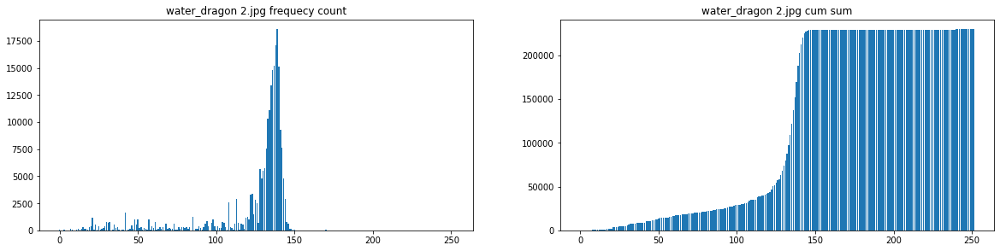

water_dragon 3.jpg predicted as water_dragon


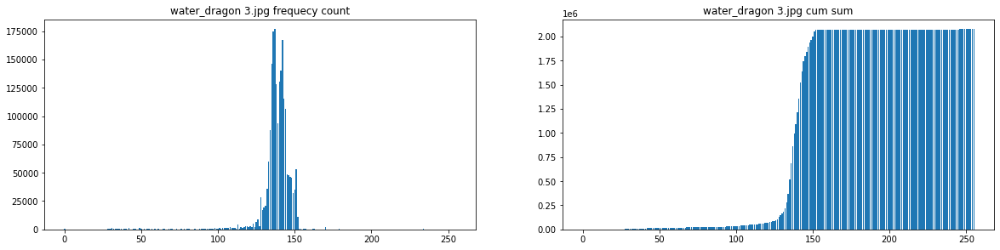

water_dragon 4.jpg predicted as water_dragon


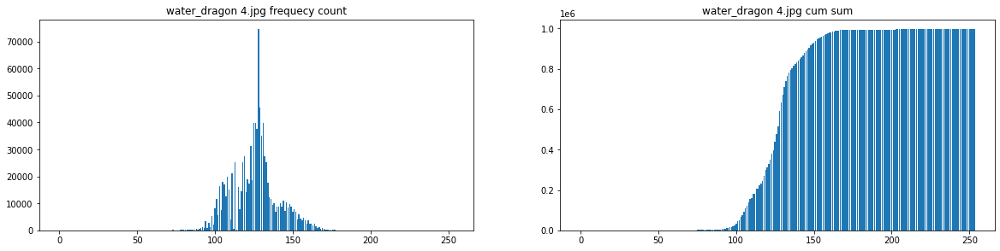

water_dragon 5.jpg predicted as water_dragon


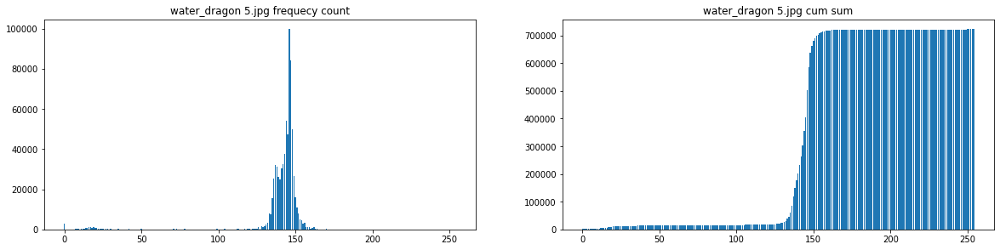

In [59]:
def predict ( cum_sum,dragon_types):
# lebih banyak intensitas rendah, prediksi sebagai malam
    if cum_sum[ 50 ] > (cum_sum[ 150 ] - cum_sum[ 50 ]):
        return dragon_types[0]
    else :
        return dragon_types[1]

for dragon_type in dragon_types:
    for path_DT in os.listdir(f'{path_dir}\\{dragon_type}'):
        buffer_img = io.imread(f'{path_dir}\\{dragon_type}\\{path_DT}')
        buffer_img= color.rgb2hsv(buffer_img)
        buffer_img = util.img_as_ubyte(buffer_img[:,:,0].flatten())
        frequency_count = np.bincount(buffer_img)
        cum_sum = np.cumsum(frequency_count) 
        print(f'{dragon_type} {path_DT} predicted as {predict (cum_sum,dragon_types)}')
        # Visualization only for understanding purposes
        plt.figure(figsize=( 20 , 10 ))
        plt.subplot( 2 , 2 , 1 )
        plt.title( f'{dragon_type} {path_DT} frequecy count' )
        plt.bar(np.arange(len(frequency_count)),frequency_count)
        # Sum image
        plt.subplot( 2 , 2 , 2 )
        plt.title( f'{dragon_type} {path_DT} cum sum' )
        plt.bar(np.arange(len(cum_sum)),cum_sum)
        plt.show()

In [75]:
import cv2 as cv
import numpy as np
from matplotlib import pyplot as plt
# Import citra yang dibutuhkan
citra_monas = cv.cvtColor(cv.imread( 'monas.jpg' ),cv.COLOR_BGR2RGB)
template_obor = cv.cvtColor(cv.imread( 'obor-monas.jpg' ),cv.COLOR_BGR2RGB)
# Ubah gray
citra_monas_gray = cv.cvtColor(citra_monas, cv.COLOR_RGB2GRAY)
template_obor_gray = cv.cvtColor(template_obor, cv.COLOR_RGB2GRAY)
# Menyimpan width dan height template
w, h = template_obor_gray.shape[:: -1 ]
# Apply template matching
# parameter ketiga merupakan method, bisa melihat dokumentasi openCV untuk penjelasan lebih lanjut dan pilihan method lainnya
res = cv.matchTemplate(citra_monas_gray, template_obor_gray, cv.TM_CCOEFF_NORMED)
# Copy citra monas untuk ditandai bounding box
template_matched = citra_monas.copy()
# Tentukan threshold
thresholds = [0.9, 0.7,0.5]
for threshold in thresholds:
    loc = np.where( res >= threshold)
    # Buat bounding box dengan rectangle. Rectangle memiliki 4 parameter yaitu (image, start_point, end_point, color, thickness)
    for point in zip (*loc[:: -1 ]):
        cv.rectangle(template_matched, point, (point[ 0 ] + w, point[ 1 ] + h), ( 0 , 0 , 255 ), 2 )
    # Menampilkan citra
    plt.figure(figsize=( 20 , 10 ))
    plt.subplot( 131 ),plt.imshow(citra_monas)
    plt.title( 'Citra Monas' ), plt.xticks([]), plt.yticks([])
    plt.subplot( 132 ),plt.imshow(template_obor)
    plt.title( 'Template Obor' ), plt.xticks([]), plt.yticks([])
    plt.subplot( 133 ),plt.imshow(template_matched)
    plt.title( 'Template Matched' ), plt.xticks([]),plt.yticks([])
    plt.show()

error: OpenCV(4.4.0) C:\Users\appveyor\AppData\Local\Temp\1\pip-req-build-6sxsq0tp\opencv\modules\imgproc\src\color.cpp:182: error: (-215:Assertion failed) !_src.empty() in function 'cv::cvtColor'


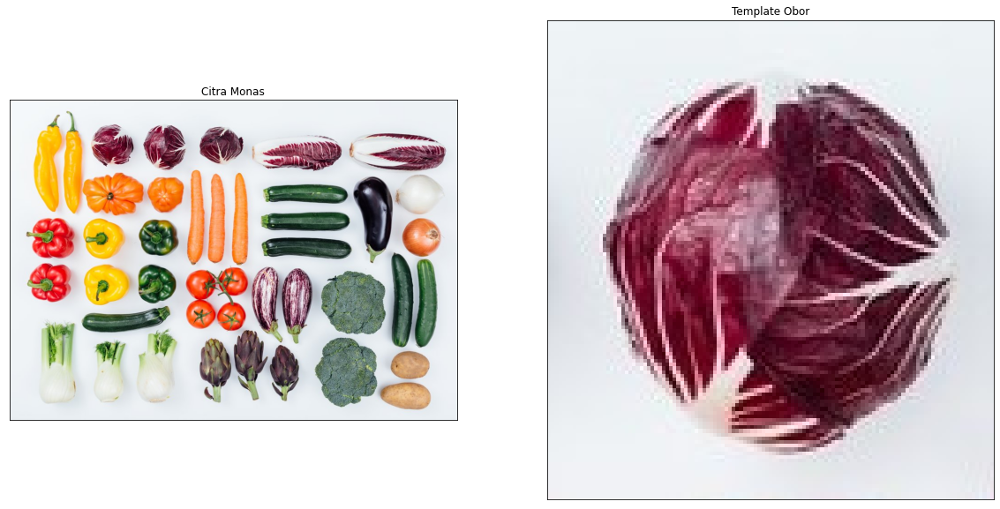

In [64]:
path_dir='Tugas Lab 5 - Images\\Tugas Lab 5 - Images'
img_uses = ['sayuran.jpg','kol.jpg']
sayuran_img = cv.cvtColor(cv.imread( f'{path_dir}\\{img_uses[0]}' ),cv.COLOR_BGR2RGB)
kol_img = cv.cvtColor(cv.imread( f'{path_dir}\\{img_uses[1]}' ),cv.COLOR_BGR2RGB)

plt.figure(figsize=( 20 , 10 ))
plt.subplot( 121 ),plt.imshow(sayuran_img)
plt.title( 'Citra Monas' ), plt.xticks([]), plt.yticks([])
plt.subplot( 122 ),plt.imshow(kol_img)
plt.title( 'Template Obor' ), plt.xticks([]), plt.yticks([])
plt.show()

In [65]:
sayuran_img_gray = cv.cvtColor(sayuran_img, cv.COLOR_RGB2GRAY)
kol_img_gray = cv.cvtColor(kol_img, cv.COLOR_RGB2GRAY)
# Menyimpan width dan height template
w, h = kol_img_gray.shape[:: -1 ]

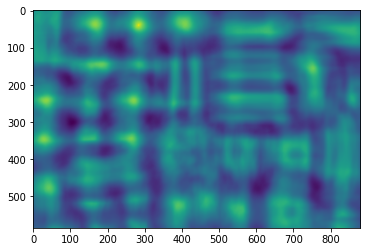

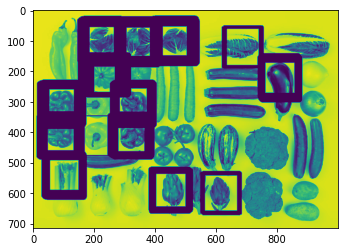

In [81]:
plt.imshow(res)
plt.show()
plt.imshow(template_matched)

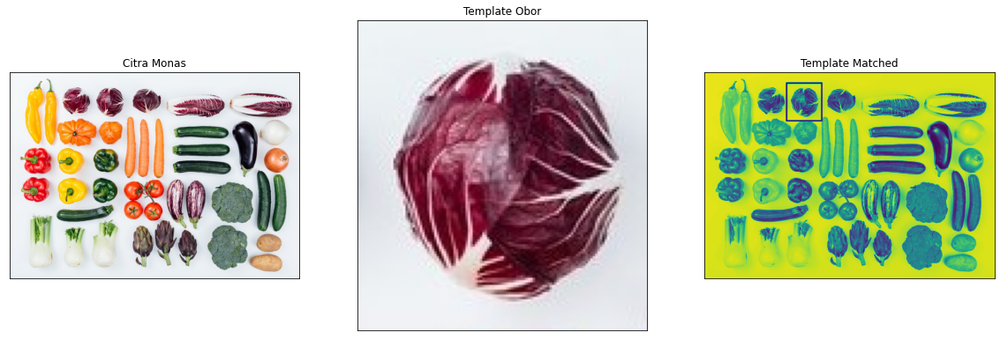

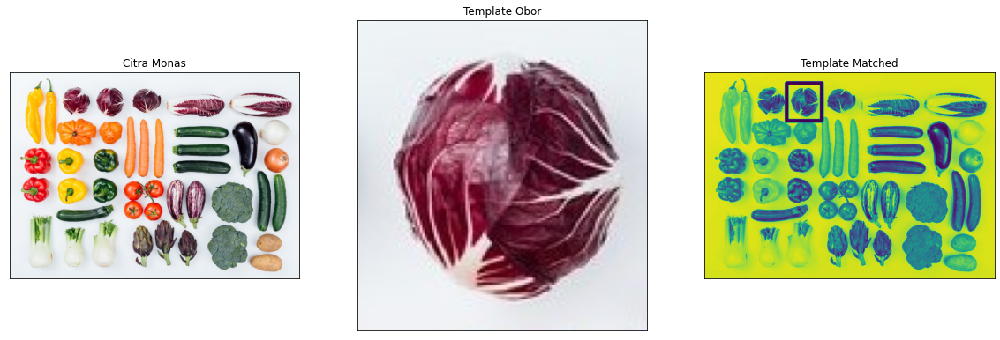

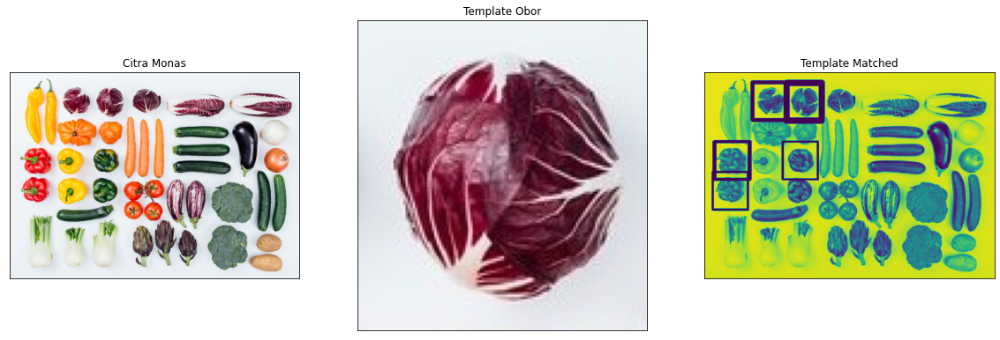

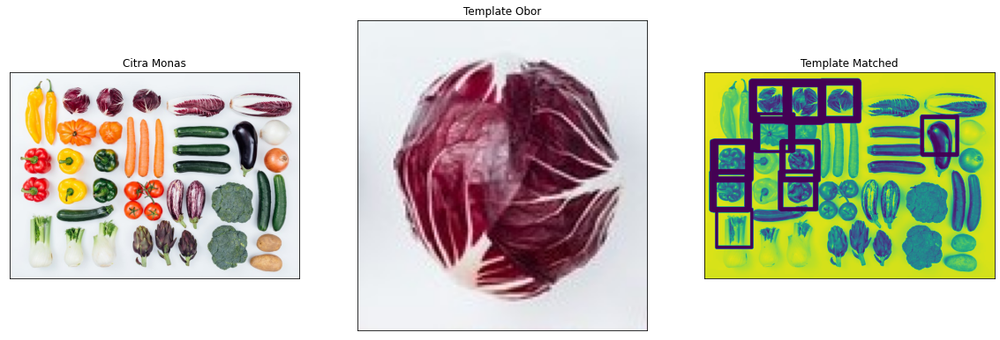

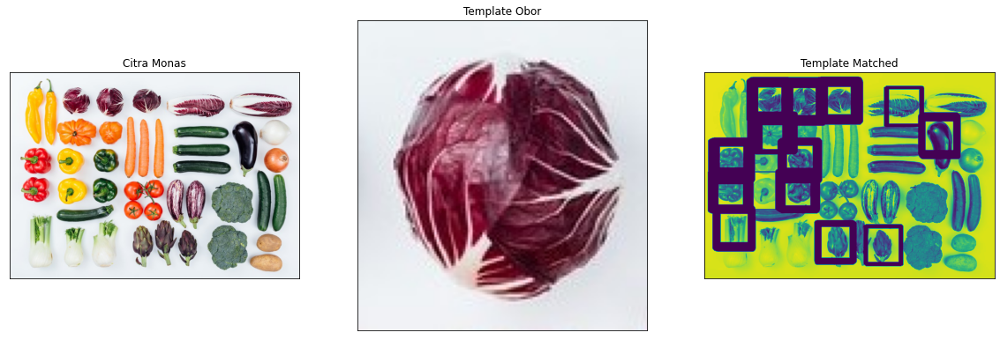

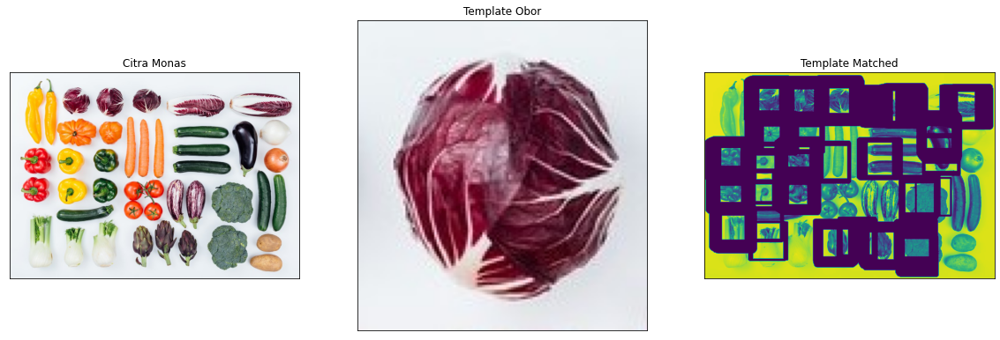

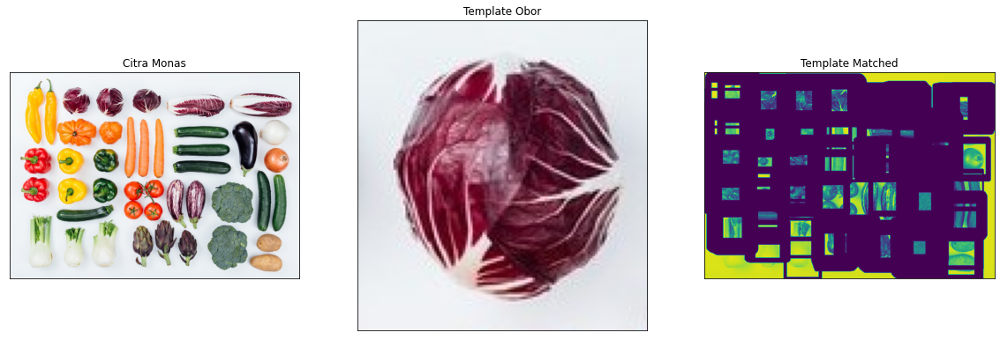

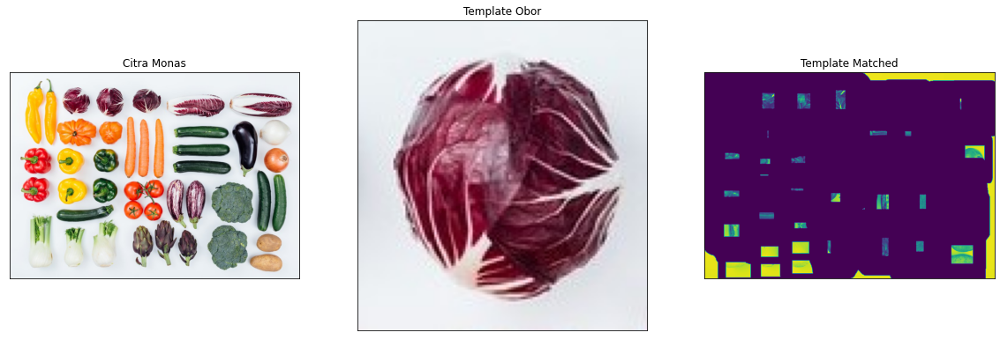

In [88]:
res = cv.matchTemplate(sayuran_img_gray, kol_img_gray, cv.TM_CCOEFF_NORMED)
template_matched = sayuran_img_gray.copy()
# thresholds = [0.9, 0.7,0.5]
thresholds = [0.9, 0.8,0.7,0.6,0.5,0.4,0.3,0.2]
# thresholds = np.arange(0,9,1)/10
for threshold in thresholds:
    loc = np.where( res >= threshold)
    for point in zip (*loc[:: -1 ]):
        cv.rectangle(template_matched, point, (point[ 0 ] + w, point[ 1 ] + h), ( 0 , 0 , 255 ), 2 )

    plt.figure(figsize=( 20 , 10 ))
    plt.subplot( 131 ),plt.imshow(sayuran_img)
    plt.title( 'Citra Monas' ), plt.xticks([]), plt.yticks([])
    plt.subplot( 132 ),plt.imshow(kol_img)
    plt.title( 'Template Obor' ), plt.xticks([]), plt.yticks([])
    plt.subplot( 133 ),plt.imshow(template_matched)
    plt.title( 'Template Matched' ), plt.xticks([]),plt.yticks([])
    plt.show()

In [86]:
np.arange(0,9,1)/10

array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8])